# Predição de Ocupação de Leitos com SVR

 ### <b>  *CILAB - Computational Intelligence Laboratory*<b>

![purple-divider](https://user-images.githubusercontent.com/7065401/52071927-c1cd7100-2562-11e9-908a-dde91ba14e59.png)
    
# **IMPORTANDO E LIMPANDO OS DADOS**
---
## Dados de Ocupação de Leitos de UTI

In [1]:
# Importando bibliotecas para manipulação visualização inicial
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

In [2]:
df = pd.read_csv('dados/ocup_leitos_covid19_atual.csv', sep=';', parse_dates=['data_coleta'])
df

,data_coleta,uf,taxa_ocup,alerta
0,2020-07-17,Rondônia,"74,2",Médio
1,2020-07-27,Rondônia,"79,2",Médio
2,2020-08-10,Rondônia,"62,6",Médio
3,2020-08-24,Rondônia,"71,0",Médio
4,2020-09-07,Rondônia,"66,8",Médio
...,...,...,...,...
994,2021-06-21,Rio de Janeiro,"66,0",Médio
995,2021-06-28,Rio de Janeiro,"63,0",Médio
996,2021-07-05,Rio de Janeiro,"59,0",Baixo
997,2021-07-12,Rio de Janeiro,"57,0",Baixo


In [3]:
#df.info()
df['taxa_ocup'] = df['taxa_ocup'].apply(lambda x: str(x).replace(',', '.'))
df['taxa_ocup'] = df['taxa_ocup'].astype('float64')
#df.info()
#df.uf.value_counts()

# Rearranjando colunas
df['alerta'] = df['uf'].values
df = df.rename(index=str, columns={'uf': 'Dias', 'alerta': 'uf', 'data_coleta': 'Data', 'taxa_ocup':'Taxa de Ocupação'})

# Calculando coluna "dias" a partir das datas
df['Dias'] = df['Data'].apply(lambda x: abs((x - df['Data'].iloc[0]).days))

df.tail()

,Data,Dias,Taxa de Ocupação,uf
994,2021-06-21,339,66.0,Rio de Janeiro
995,2021-06-28,346,63.0,Rio de Janeiro
996,2021-07-05,353,59.0,Rio de Janeiro
997,2021-07-12,360,57.0,Rio de Janeiro
998,2021-07-19,367,60.0,Rio de Janeiro


![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

## Média da Ocupação de Leitos no Brasil

In [4]:
# Calculando médias das taxas de ocupação de leitos

med_brasil = list()
brasil = df.loc[(df.uf == 'Rondônia')]

for i in brasil.index:
    cond = df['Data'] == brasil['Data'][i]
    med_brasil.append(df.loc[cond, 'Taxa de Ocupação'].mean())
    
# Exclundo a coluna 'uf'
brasil = brasil.drop(['uf'], axis=1)

In [5]:
# Atribuindo média de ocupação dos Estados da região
brasil.loc[:, 'Taxa de Ocupação'] = med_brasil.copy()
# norte.loc.__setitem__((slice(None), 'taxa_ocup', med_norte)

In [6]:
len(brasil)

37

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# Agrupando por Regiões: *Norte, Nordeste, Sul, Sudeste e Centro-Oeste*
---

## Região Norte

In [7]:
dfnorte = df.loc[
    (df.uf == 'Rondônia') | (df.uf == 'Acre') | (df.uf == 'Amazonas') |
    (df.uf == 'Roraima') | (df.uf == 'Pará') | (df.uf == 'Amapá') | 
    (df.uf == 'Tocantins')
]

In [8]:
# Calculando médias das taxas de ocupação de leitos
med_norte = list()
norte = dfnorte.loc[(dfnorte.uf == 'Rondônia')]

for i in norte.index:
    cond = dfnorte['Data'] == norte['Data'][i]
    med_norte.append(dfnorte.loc[cond, 'Taxa de Ocupação'].mean())

norte = norte.drop(['uf'], axis=1)

In [9]:
# Atribuindo média de ocupação dos Estados da região
norte.loc[:,'Taxa de Ocupação'] = med_norte#.copy()

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

## Região Nordeste

In [10]:
dfnordeste = df.loc[
    (df.uf == 'Maranhão') | (df.uf == 'Piauí') | (df.uf == 'Ceará') |
    (df.uf == 'Rio Grande do Norte') | (df.uf == 'Paraíba') | (df.uf == 'Pernambuco') | 
    (df.uf == 'Alagoas') | (df.uf == 'Sergipe') | (df.uf == 'Bahia')
]

In [11]:
#dfnordeste.uf.value_counts()

In [12]:
# Calculando médias das taxas de ocupação de leitos

med_nordeste = list()
nordeste = dfnordeste.loc[(dfnordeste.uf == 'Piauí')]

for i in nordeste.index:
    cond = dfnordeste['Data'] == nordeste['Data'][i]
    med_nordeste.append(dfnordeste.loc[cond, 'Taxa de Ocupação'].mean())
    
nordeste = nordeste.drop(['uf'], axis=1)

In [13]:
# Atribuindo média de ocupação dos Estados da região
nordeste.loc[:,'Taxa de Ocupação'] = med_nordeste#.copy()

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

## Região Sudeste

In [14]:
dfsudeste = df.loc[
    (df.uf == 'Minas Gerais') | (df.uf == 'Espírito Santo') |
    (df.uf == 'São Paulo') | (df.uf == 'Rio de Janeiro')
]

In [15]:
#dfsudeste.uf.value_counts()

In [16]:
# Calculando médias das taxas de ocupação de leitos

med_sudeste = list()
sudeste = dfsudeste.loc[(dfsudeste.uf == 'Minas Gerais')]

for i in sudeste.index:
    cond = dfsudeste['Data'] == sudeste['Data'][i]
    med_sudeste.append(dfsudeste.loc[cond, 'Taxa de Ocupação'].mean())

sudeste = sudeste.drop(['uf'], axis=1)

In [17]:
# Atribuindo média de ocupação dos Estados da região
sudeste.loc[:,'Taxa de Ocupação'] = med_sudeste.copy()

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

## Região Sul

In [18]:
dfsul = df.loc[
    (df.uf == 'Paraná') | (df.uf == 'Santa Catarina') | (df.uf == 'Rio Grande do Sul')
]

In [19]:
# dfsul.uf.value_counts()

In [20]:
# Calculando médias das taxas de ocupação de leitos

med_sul = list()
sul = dfsul.loc[(dfsul.uf == 'Santa Catarina')]

for i in sul.index:
    cond = dfsul['Data'] == sul['Data'][i]
    med_sul.append(dfsul.loc[cond, 'Taxa de Ocupação'].mean())
    
sul = sul.drop(['uf'], axis=1)

In [21]:
# Atribuindo média de ocupação dos Estados da região
sul.loc[:,'Taxa de Ocupação'] = med_sul#.copy()

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

## Região Centro-Oeste

In [22]:
dfcentro_oeste = df.loc[
    (df.uf == 'Mato Grosso') | (df.uf == 'Goiás') | 
    (df.uf == 'Distrito Federal') | (df.uf == 'Mato Grosso do Sul')
]

In [23]:
#dfcentro_oeste.uf.value_counts()

In [24]:
# Calculando médias das taxas de ocupação de leitos

med_centro_oeste = list()
centro_oeste = dfcentro_oeste.loc[(dfcentro_oeste.uf == 'Goiás')]

for i in centro_oeste.index:
    cond = dfcentro_oeste['Data'] == centro_oeste['Data'][i]
    med_centro_oeste.append(dfcentro_oeste.loc[cond, 'Taxa de Ocupação'].mean())

centro_oeste = centro_oeste.drop(['uf'], axis=1)

In [25]:
# Atribuindo média de ocupação dos Estados da região
centro_oeste.loc[:,'Taxa de Ocupação'] = med_centro_oeste#.copy()

![purple-divider](https://user-images.githubusercontent.com/7065401/52071927-c1cd7100-2562-11e9-908a-dde91ba14e59.png)

## Dados de Vacinação no Brasil


In [26]:
vac = pd.read_csv('dados/vacinacao_2dose_atual.csv', parse_dates=['DataBrasil'])
vac.head()

,DataBrasil,PercentualBrasil
0,2021-01-17,"0,00"
1,2021-01-18,"0,00"
2,2021-01-19,"0,00"
3,2021-01-20,"0,00"
4,2021-01-21,"0,00"


In [27]:
index = np.array(range(len(vac)))
vac['index'] = index
vac = vac.set_index(['index'])

vac['PercentualBrasil'] = vac['PercentualBrasil'].apply(lambda x: str(x).replace(',', '.'))
vac['PercentualBrasil'] = vac['PercentualBrasil'].astype('float64')

# Calculando coluna "dias" a partir das datas
vac['Dias'] = vac['DataBrasil'].apply(lambda x: abs((x - vac['DataBrasil'].iloc[0]).days))

vac = vac.rename(index=str, columns={'DataBrasil': 'Data', 'PercentualBrasil': 'Percentual'})

vac = vac[['Data', 'Dias', 'Percentual']]
vac

,Data,Dias,Percentual
index,,,
0,2021-01-17,0,0.00
1,2021-01-18,1,0.00
2,2021-01-19,2,0.00
3,2021-01-20,3,0.00
4,2021-01-21,4,0.00
...,...,...,...
179,2021-07-15,179,20.51
180,2021-07-16,180,20.91
181,2021-07-17,181,21.13



### Criando novo dataframe de vacinas com todas as datas

In [28]:
Datas = brasil['Data']
Percentual = np.zeros(shape=len(brasil))
index = np.array(range(len(brasil)))

vacina = pd.DataFrame({'Data': Datas, 'Percentual': Percentual, 'index': index})

vacina = vacina.set_index(['index'])

vacina['Dias'] = vacina['Data'].apply(lambda x: abs((x - df['Data'].iloc[0]).days))

vacina = vacina[['Data', 'Dias', 'Percentual']]

In [29]:
# Atribuindo valores de percentual a todas as datas
for i in vacina.index:
    for j in vac.index:
        if  vacina.Data[i] == vac.Data[j]:
            vacina.loc[i, 'Percentual'] = vac.Percentual[j]         

In [30]:
#vacina.tail()

## Preparando o DataFrame '**brasil**' para predição com 2 variáveis 

In [31]:
# Criando a coluna com o percentual de vacinação
brasil['Vacina'] = vacina['Percentual'].values
brasil.head()

,Data,Dias,Taxa de Ocupação,Vacina
0,2020-07-17,0,65.511111,0.0
1,2020-07-27,10,65.500000,0.0
2,2020-08-10,24,63.200000,0.0
3,2020-08-24,38,58.874074,0.0
4,2020-09-07,52,55.174074,0.0


In [32]:
# Para depois
#for i in range(1, 5):
#    percent.append(y_pred[i])

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

## Dados de Vacinação das Regiões

In [33]:
vac_r = pd.read_csv('dados/vacinacao_regioes.csv', parse_dates=['data'])
vac_r.head()

,regiao,data,taxa_vacinacao
0,NORDESTE,2021-01-19,0.0
1,NORDESTE,2021-01-20,0.0
2,NORDESTE,2021-01-21,0.0
3,NORDESTE,2021-01-22,0.0
4,NORDESTE,2021-01-23,0.0


In [34]:
vac_r = vac_r.rename(index=str, columns={'data': 'Data', 'taxa_vacinacao': 'Percentual'})

# Calculando coluna "dias" a partir das datas
vac_r['Dias'] = vac_r['Data'].apply(lambda x: abs((x - vac_r['Data'].iloc[0]).days))

index = np.array(range(len(vac_r)))
vac_r['index'] = index
vac_r = vac_r.set_index(['index'])
vac_r = vac_r[['regiao', 'Data', 'Dias', 'Percentual']]
vac_r

,regiao,Data,Dias,Percentual
index,,,,
0,NORDESTE,2021-01-19,0,0.00
1,NORDESTE,2021-01-20,1,0.00
2,NORDESTE,2021-01-21,2,0.00
3,NORDESTE,2021-01-22,3,0.00
4,NORDESTE,2021-01-23,4,0.00
...,...,...,...,...
907,SUL,2021-07-15,177,22.01
908,SUL,2021-07-16,178,22.48
909,SUL,2021-07-17,179,22.83


## NORDESTE

In [35]:
vac_nordeste = vac_r.loc[(vac_r.regiao == 'NORDESTE')]
vac_nordeste = vac_nordeste.drop(['regiao'], axis=1)
vac_nordeste

Datas = brasil['Data']
Percentual = np.zeros(shape=len(brasil))
index = np.array(range(len(brasil)))

vacina_nordeste = pd.DataFrame({'Data': Datas, 'Percentual': Percentual, 'index': index})

vacina_nordeste = vacina_nordeste.set_index(['index'])

vacina_nordeste['Dias'] = vacina_nordeste['Data'].apply(lambda x: abs((x - df['Data'].iloc[0]).days))

vacina_nordeste = vacina_nordeste[['Data', 'Dias', 'Percentual']]

# Atribuindo valores de percentual a todas as datas
for i in vacina_nordeste.index:
    for j in vac_nordeste.index:
        if  vacina_nordeste.Data[i] == vac_nordeste.Data[j]:
            vacina_nordeste.loc[i, 'Percentual'] = vac_nordeste.Percentual[j]
            
# Criando a coluna com o percentual de vacinação
nordeste['Vacina'] = vacina_nordeste['Percentual'].values
nordeste.tail()

,Data,Dias,Taxa de Ocupação,Vacina
328,2021-06-21,339,80.666667,14.28
329,2021-06-28,346,75.111111,15.00
330,2021-07-05,353,64.222222,16.38
331,2021-07-12,360,58.555556,18.18
332,2021-07-19,367,53.111111,19.54


## NORTE

In [36]:
vac_norte = vac_r.loc[(vac_r.regiao == 'NORTE')]
vac_norte = vac_norte.drop(['regiao'], axis=1)
vac_norte

Datas = brasil['Data']
Percentual = np.zeros(shape=len(brasil))
index = np.array(range(len(brasil)))

vacina_norte = pd.DataFrame({'Data': Datas, 'Percentual': Percentual, 'index': index})

vacina_norte = vacina_norte.set_index(['index'])

vacina_norte['Dias'] = vacina_norte['Data'].apply(lambda x: abs((x - df['Data'].iloc[0]).days))

vacina_norte = vacina_norte[['Data', 'Dias', 'Percentual']]

# Atribuindo valores de percentual a todas as datas
for i in vacina_norte.index:
    for j in vac_norte.index:
        if  vacina_norte.Data[i] == vac_norte.Data[j]:
            vacina_norte.loc[i, 'Percentual'] = vac_norte.Percentual[j]
    
# Criando a coluna com o percentual de vacinação
norte['Vacina'] = vacina_norte['Percentual'].values
norte.tail()

,Data,Dias,Taxa de Ocupação,Vacina
32,2021-06-21,339,64.428571,13.05
33,2021-06-28,346,64.714286,14.16
34,2021-07-05,353,60.000000,15.44
35,2021-07-12,360,58.714286,16.96
36,2021-07-19,367,56.285714,18.11


## SEDESTE

In [37]:
vac_sudeste = vac_r.loc[(vac_r.regiao == 'SUDESTE')]
vac_sudeste = vac_sudeste.drop(['regiao'], axis=1)
vac_sudeste

Datas = brasil['Data']
Percentual = np.zeros(shape=len(brasil))
index = np.array(range(len(brasil)))

vacina_sudeste = pd.DataFrame({'Data': Datas, 'Percentual': Percentual, 'index': index})

vacina_sudeste = vacina_sudeste.set_index(['index'])

vacina_sudeste['Dias'] = vacina_sudeste['Data'].apply(lambda x: abs((x - df['Data'].iloc[0]).days))

vacina_sudeste = vacina_sudeste[['Data', 'Dias', 'Percentual']]

# Atribuindo valores de percentual a todas as datas
for i in vacina_sudeste.index:
    for j in vac_sudeste.index:
        if  vacina_sudeste.Data[i] == vac_sudeste.Data[j]:
            vacina_sudeste.loc[i, 'Percentual'] = vac_sudeste.Percentual[j]
    
# Criando a coluna com o percentual de vacinação
sudeste['Vacina'] = vacina_sudeste['Percentual'].values
sudeste.tail()

,Data,Dias,Taxa de Ocupação,Vacina
624,2021-06-21,339,71.25,15.66
625,2021-06-28,346,69.25,16.43
626,2021-07-05,353,66.00,17.79
627,2021-07-12,360,60.50,19.69
628,2021-07-19,367,59.00,21.65


## SUL

In [38]:
vac_sul = vac_r.loc[(vac_r.regiao == 'SUL')]
vac_sul = vac_sul.drop(['regiao'], axis=1)
vac_sul

Datas = brasil['Data']
Percentual = np.zeros(shape=len(brasil))
index = np.array(range(len(brasil)))

vacina_sul = pd.DataFrame({'Data': Datas, 'Percentual': Percentual, 'index': index})

vacina_sul = vacina_sul.set_index(['index'])

vacina_sul['Dias'] = vacina_sul['Data'].apply(lambda x: abs((x - df['Data'].iloc[0]).days))

vacina_sul = vacina_sul[['Data', 'Dias', 'Percentual']]

# Atribuindo valores de percentual a todas as datas
for i in vacina_sul.index:
    for j in vac_sul.index:
        if  vacina_sul.Data[i] == vac_sul.Data[j]:
            vacina_sul.loc[i, 'Percentual'] = vac_sul.Percentual[j]
    
# Criando a coluna com o percentual de vacinação
sul['Vacina'] = vacina_sul['Percentual'].values
sul.tail()

,Data,Dias,Taxa de Ocupação,Vacina
772,2021-06-21,339,91.000000,15.84
773,2021-06-28,346,88.333333,16.56
774,2021-07-05,353,83.333333,17.67
775,2021-07-12,360,78.666667,20.39
776,2021-07-19,367,73.666667,23.33


## CENTRO-OESTE

In [39]:
vac_centro_oeste = vac_r.loc[(vac_r.regiao == 'CENTRO-OESTE')]
vac_centro_oeste = vac_centro_oeste.drop(['regiao'], axis=1)
vac_centro_oeste

Datas = brasil['Data']
Percentual = np.zeros(shape=len(brasil))
index = np.array(range(len(brasil)))

vacina_centro_oeste = pd.DataFrame({'Data': Datas, 'Percentual': Percentual, 'index': index})

vacina_centro_oeste = vacina_centro_oeste.set_index(['index'])

vacina_centro_oeste['Dias'] = vacina_centro_oeste['Data'].apply(lambda x: abs((x - df['Data'].iloc[0]).days))

vacina_centro_oeste = vacina_centro_oeste[['Data', 'Dias', 'Percentual']]

# Atribuindo valores de percentual a todas as datas
for i in vacina_centro_oeste.index:
    for j in vac_centro_oeste.index:
        if  vacina_centro_oeste.Data[i] == vac_centro_oeste.Data[j]:
            vacina_centro_oeste.loc[i, 'Percentual'] = vac_centro_oeste.Percentual[j]
    
# Criando a coluna com o percentual de vacinação
centro_oeste['Vacina'] = vacina_centro_oeste['Percentual'].values
centro_oeste.tail()

,Data,Dias,Taxa de Ocupação,Vacina
920,2021-06-21,339,87.25,14.56
921,2021-06-28,346,82.25,15.81
922,2021-07-05,353,76.50,18.29
923,2021-07-12,360,76.00,21.28
924,2021-07-19,367,74.00,23.47


![purple-divider](https://user-images.githubusercontent.com/7065401/52071927-c1cd7100-2562-11e9-908a-dde91ba14e59.png)

# **VISUALIZAÇÃO DOS DADOS DE OCUPAÇÃO DE LEITOS UTI**
---
# Brasil

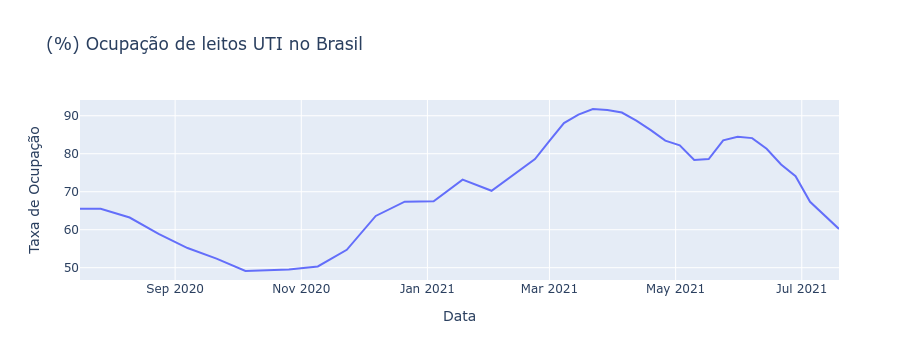

In [40]:
px.line(brasil, 'Data', 'Taxa de Ocupação', title='(%) Ocupação de leitos UTI no Brasil')

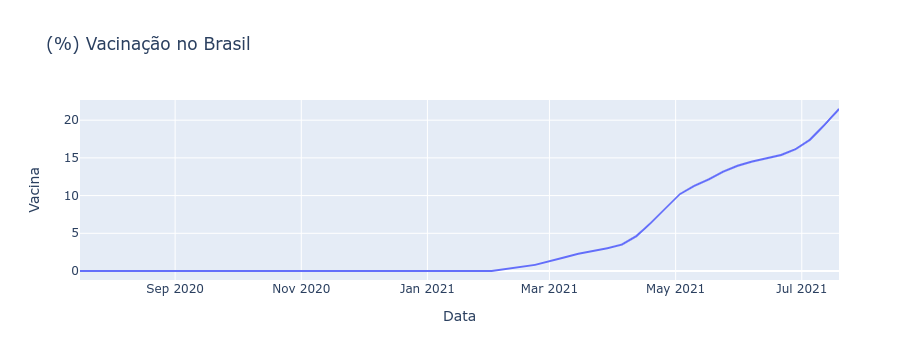

In [41]:
px.line(brasil, 'Data', 'Vacina', title='(%) Vacinação no Brasil')

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# Região Norte

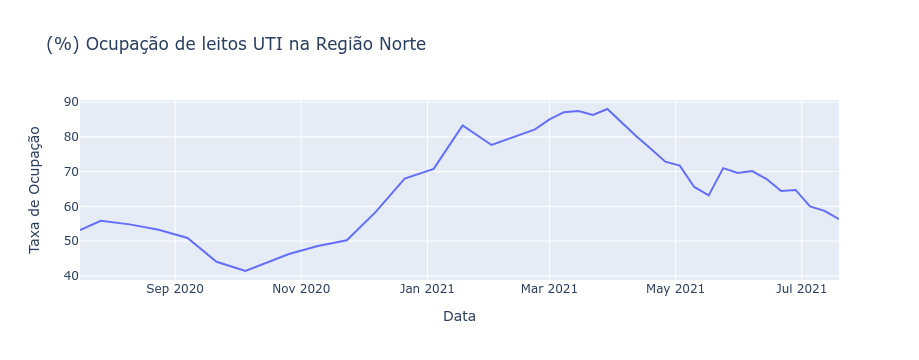

In [42]:
px.line(norte, 'Data', 'Taxa de Ocupação', title='(%) Ocupação de leitos UTI na Região Norte')

# Vacinação - Norte

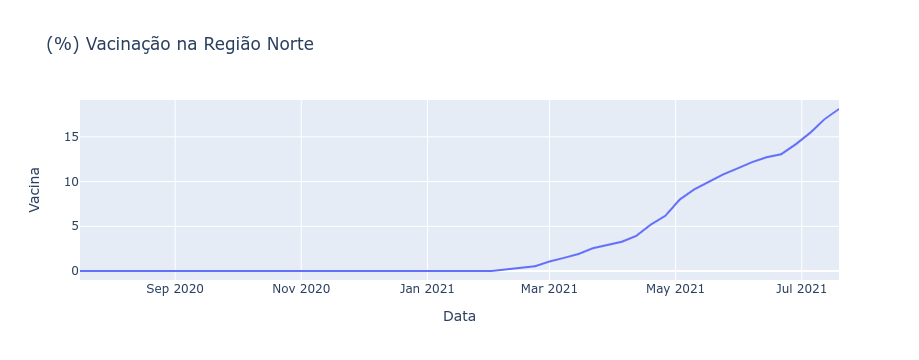

In [43]:
px.line(norte, 'Data', 'Vacina', title='(%) Vacinação na Região Norte')

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# Região Nordeste

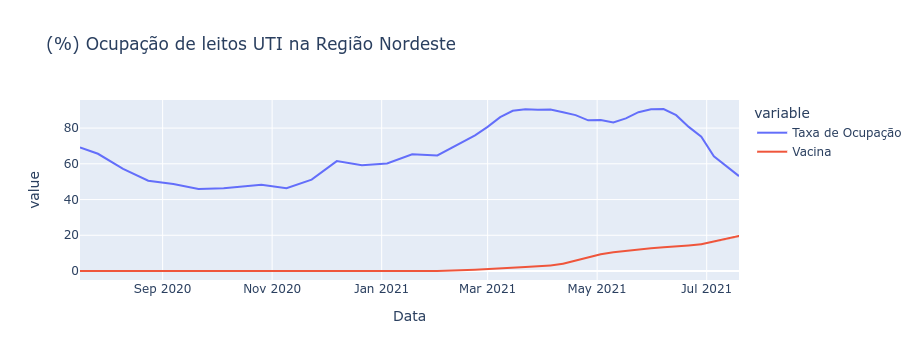

In [44]:
px.line(nordeste, 'Data', ['Taxa de Ocupação', 'Vacina'], title='(%) Ocupação de leitos UTI na Região Nordeste')

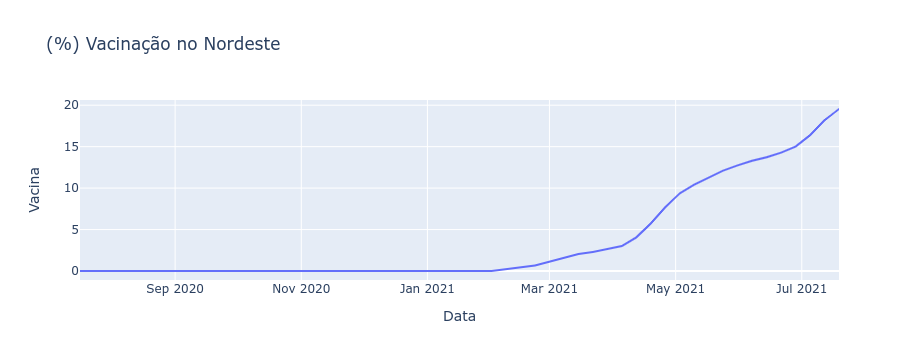

In [45]:
px.line(nordeste, 'Data', 'Vacina', title='(%) Vacinação no Nordeste')

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# Região Sul

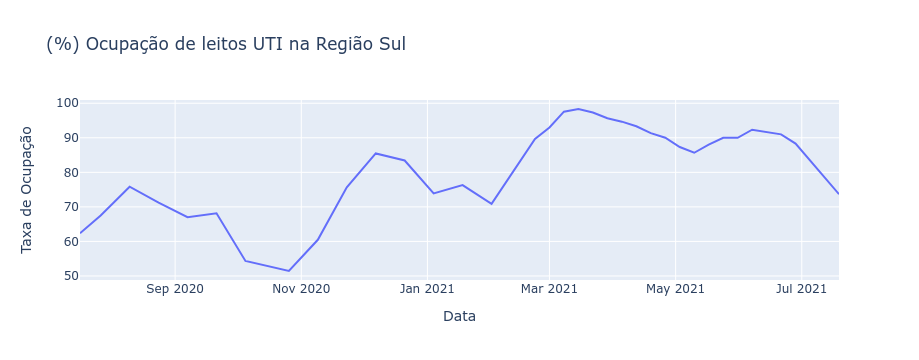

In [46]:
px.line(sul, 'Data', 'Taxa de Ocupação', title='(%) Ocupação de leitos UTI na Região Sul')

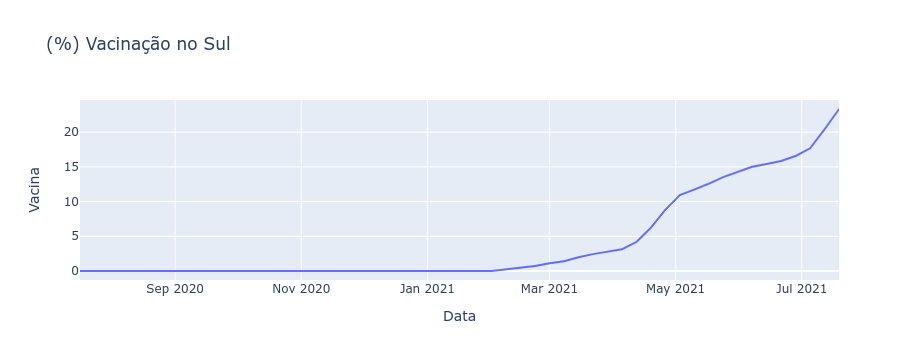

In [47]:
px.line(sul, 'Data', 'Vacina', title='(%) Vacinação no Sul')

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# Região Sudeste

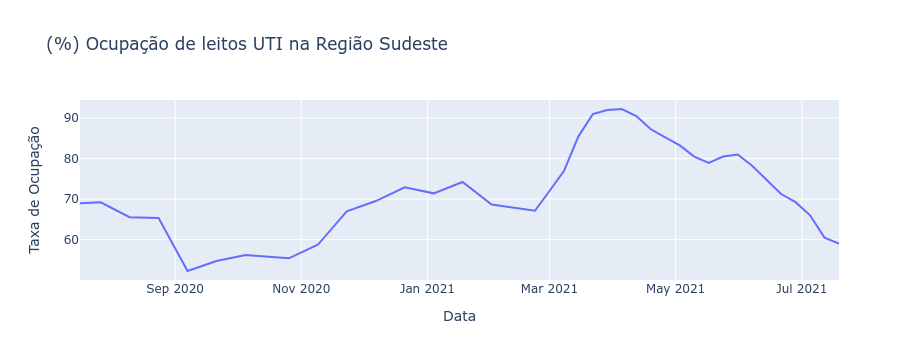

In [48]:
px.line(sudeste, 'Data', 'Taxa de Ocupação', title='(%) Ocupação de leitos UTI na Região Sudeste')

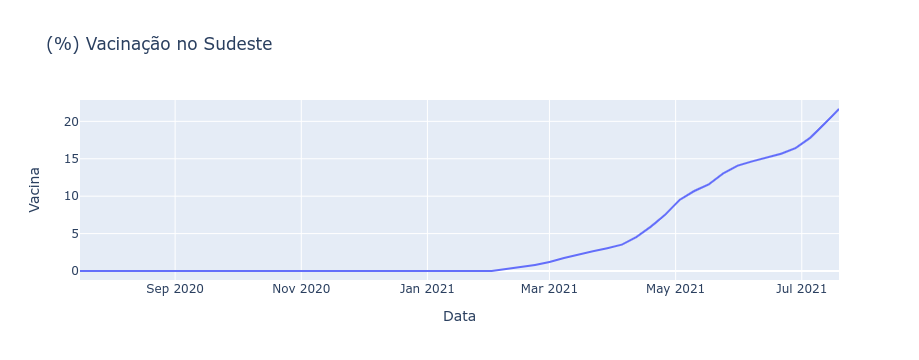

In [49]:
px.line(sudeste, 'Data', 'Vacina', title='(%) Vacinação no Sudeste')

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# Região Centro-Oeste

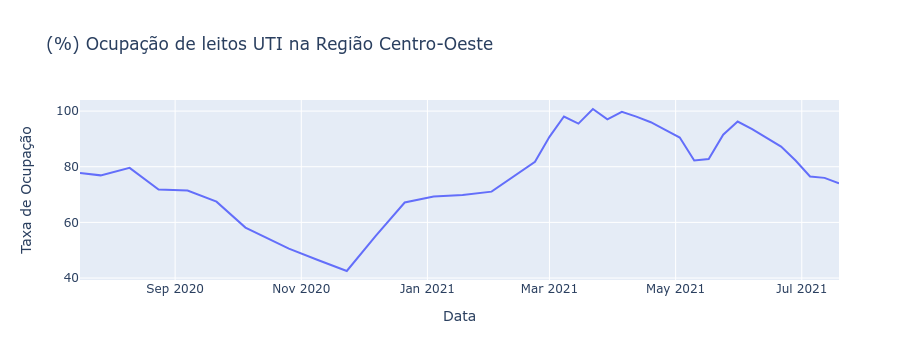

In [50]:
px.line(centro_oeste, 'Data', 'Taxa de Ocupação', title='(%) Ocupação de leitos UTI na Região Centro-Oeste')

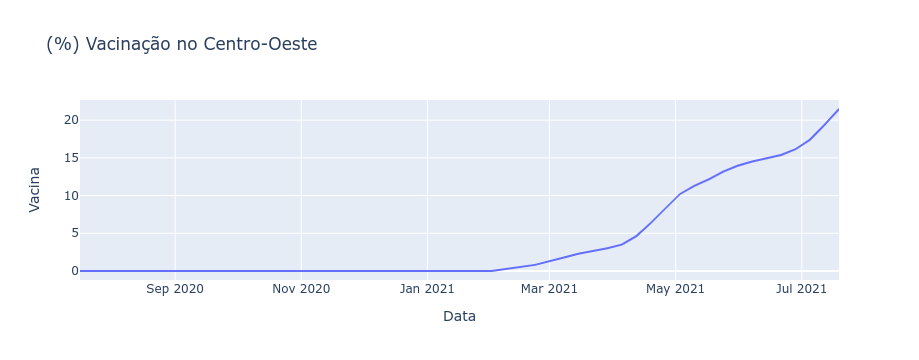

In [51]:
px.line(brasil, 'Data', 'Vacina', title='(%) Vacinação no Centro-Oeste')

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# **VACINAÇÃO NO BRASIL**

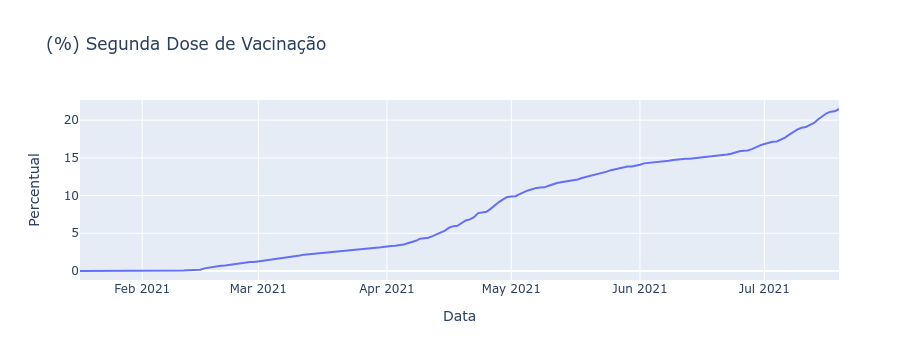

In [52]:
px.line(vac, 'Data', 'Percentual', title='(%) Segunda Dose de Vacinação')

![purple-divider](https://user-images.githubusercontent.com/7065401/52071927-c1cd7100-2562-11e9-908a-dde91ba14e59.png)

# **APLICAÇÃO DO SVR - 1 Variável Independente**
### Mesmo código da trabalho passado
---
![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# **BRASIL**


In [53]:
# Importando módulo da biblioteca criada

from SVR.model0 import predict
from SVR.model1 import predict_vac, predict_uti, valid_vac, valid_uti

/home/vini-silva/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



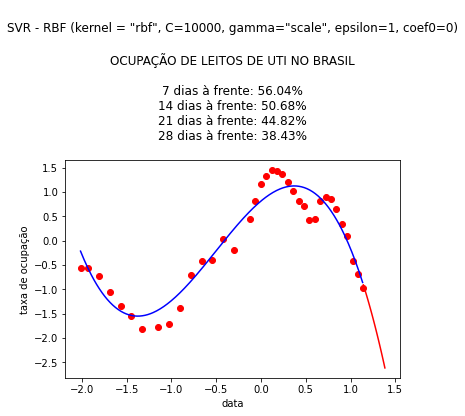

In [54]:
title = 'OCUPAÇÃO DE LEITOS DE UTI NO BRASIL'
predict(brasil, title)

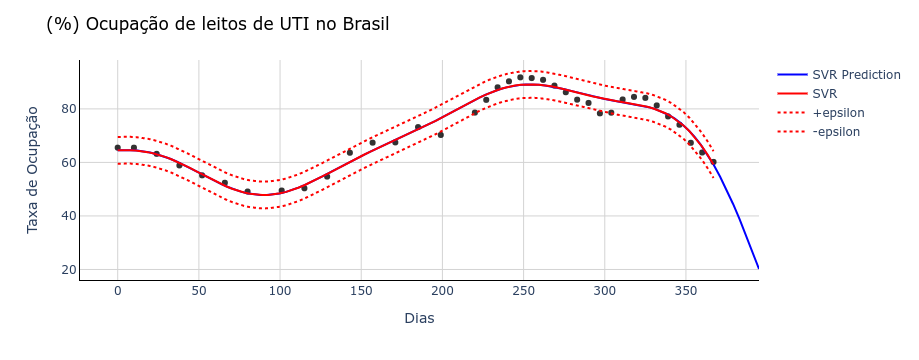

In [55]:
title = '(%) Ocupação de leitos de UTI no Brasil'
predicted_value = predict_uti(brasil, title)

In [56]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'- {i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
- 7 dias: 51.10%
- 14 dias: 41.73%
- 21 dias: 31.31%
- 28 dias: 20.17%


In [57]:
valid_uti(brasil)

MÉTRICAS:
- MAE: 2.0926
- RMSE: 2.3697
- MAPE: 0.0312


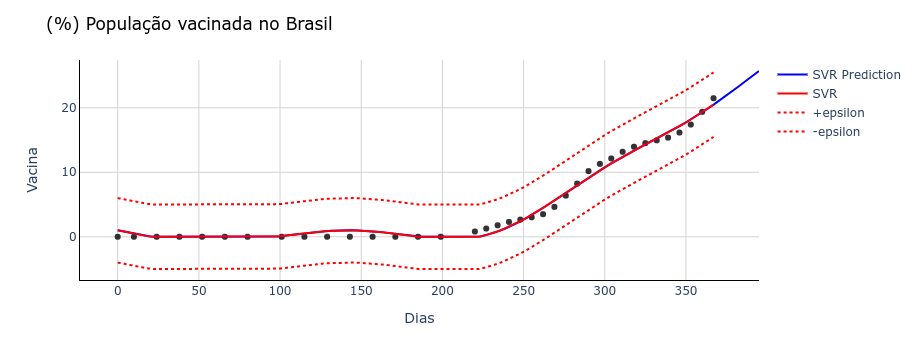

In [58]:
title = '(%) População vacinada no Brasil'
predicted_value = predict_vac(brasil, title)

In [59]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 21.73%
14 dias: 23.04%
21 dias: 24.37%
28 dias: 25.71%


In [60]:
valid_vac(brasil)

MÉTRICAS:
- MAE: 0.8139
- RMSE: 1.0341
- MAPE: 2556557578137243.0000


![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# **REGIÃO NORTE**

/home/vini-silva/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



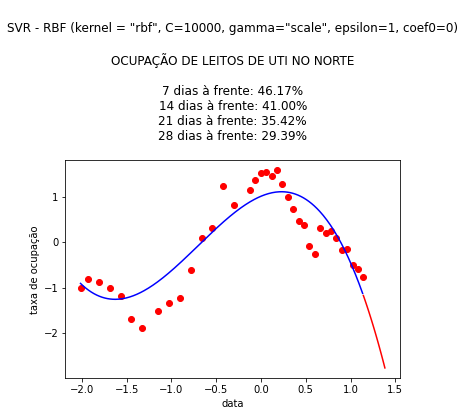

In [61]:
title = 'OCUPAÇÃO DE LEITOS DE UTI NO NORTE'
predict(norte, title)

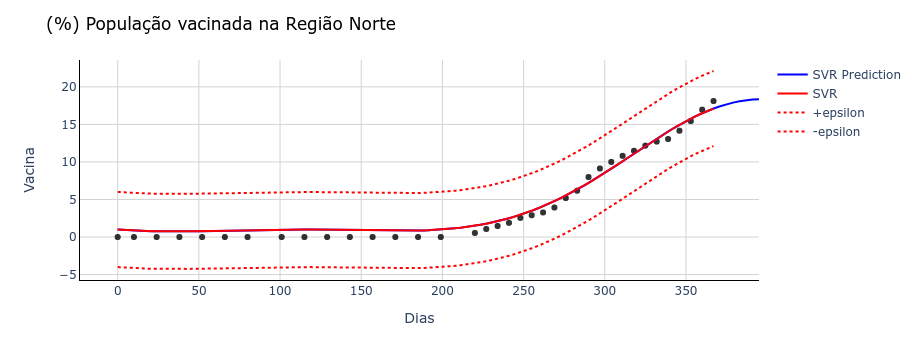

In [62]:
title = '(%) População vacinada na Região Norte'
predicted_value = predict_vac(norte, title)

In [63]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 17.62%
14 dias: 17.99%
21 dias: 18.24%
28 dias: 18.36%


In [64]:
valid_vac(norte)

MÉTRICAS:
- MAE: 0.8764
- RMSE: 0.9459
- MAPE: 2907918928060193.5000


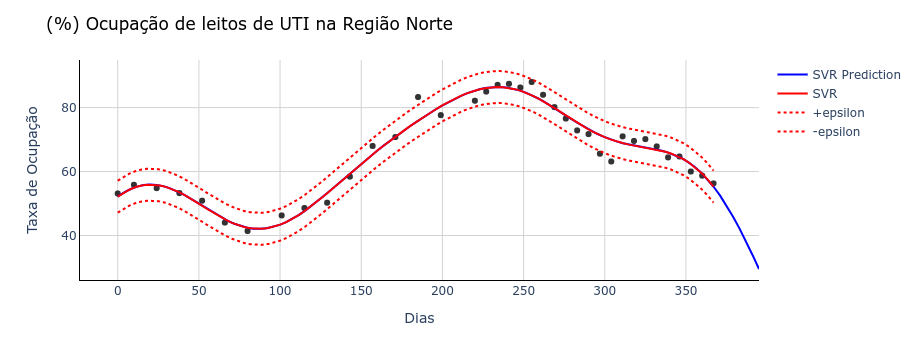

In [65]:
title = '(%) Ocupação de leitos de UTI na Região Norte'
predicted_value = predict_uti(norte, title)

In [66]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 50.18%
14 dias: 44.08%
21 dias: 37.13%
28 dias: 29.52%


In [67]:
valid_uti(norte)

MÉTRICAS:
- MAE: 2.4547
- RMSE: 3.5050
- MAPE: 0.0380


![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# **REGIÃO NORDESTE**

/home/vini-silva/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



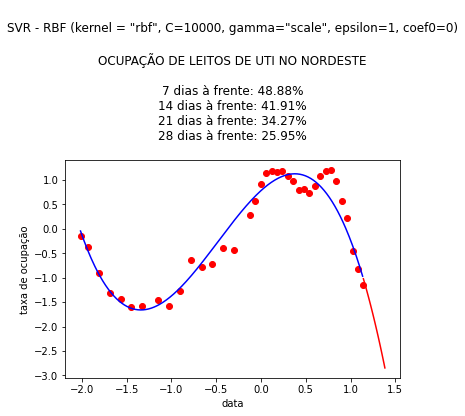

In [68]:
title = 'OCUPAÇÃO DE LEITOS DE UTI NO NORDESTE'
predict(nordeste, title)

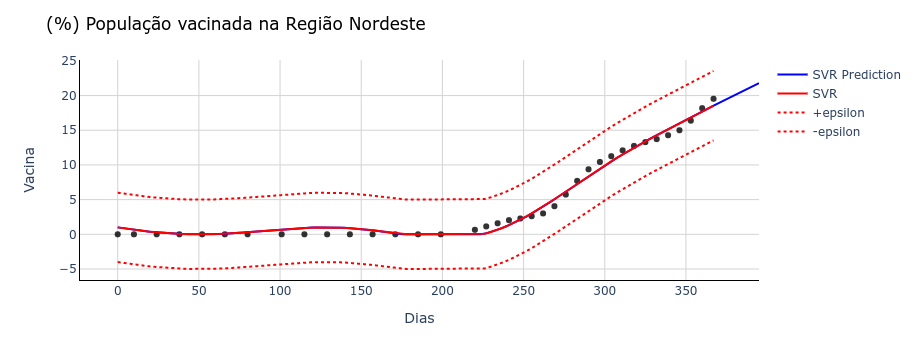

In [69]:
title = '(%) População vacinada na Região Nordeste'
predicted_value = predict_vac(nordeste, title)

In [70]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 19.38%
14 dias: 20.22%
21 dias: 21.02%
28 dias: 21.79%


In [71]:
valid_vac(nordeste)

MÉTRICAS:
- MAE: 0.8097
- RMSE: 0.9650
- MAPE: 2440338302177883.5000


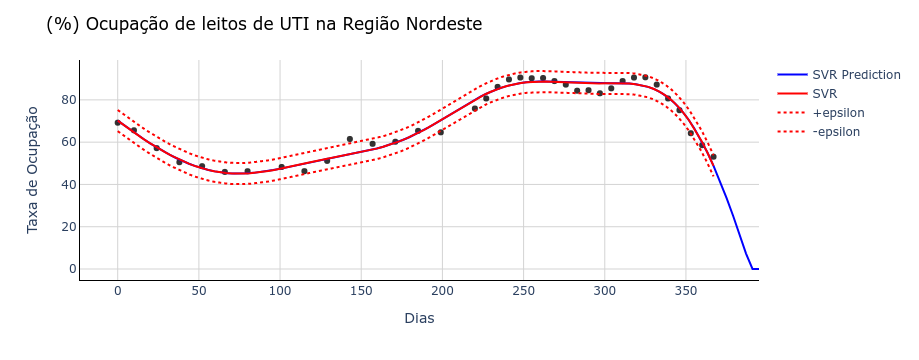

In [72]:
title = '(%) Ocupação de leitos de UTI na Região Nordeste'
predicted_value = predict_uti(nordeste, title)

In [73]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 35.68%
14 dias: 20.93%
21 dias: 5.00%
28 dias: -11.56%


In [74]:
valid_uti(nordeste)

MÉTRICAS:
- MAE: 4.3999
- RMSE: 5.4538
- MAPE: 0.0694


![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# **REGIÃO SUL**

/home/vini-silva/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



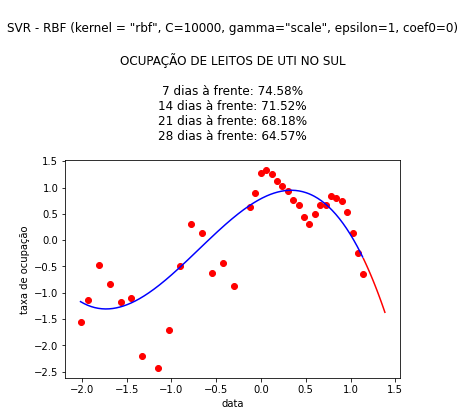

In [75]:
title = 'OCUPAÇÃO DE LEITOS DE UTI NO SUL'
predict(sul, title)

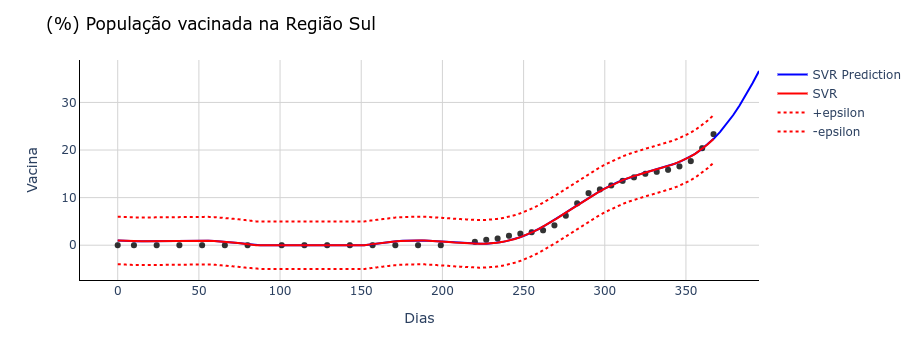

In [76]:
title = '(%) População vacinada na Região Sul'
predicted_value = predict_vac(sul, title)

In [77]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 25.00%
14 dias: 28.29%
21 dias: 32.18%
28 dias: 36.61%


In [78]:
valid_vac(sul)

MÉTRICAS:
- MAE: 0.8019
- RMSE: 0.9565
- MAPE: 2372368414143239.0000


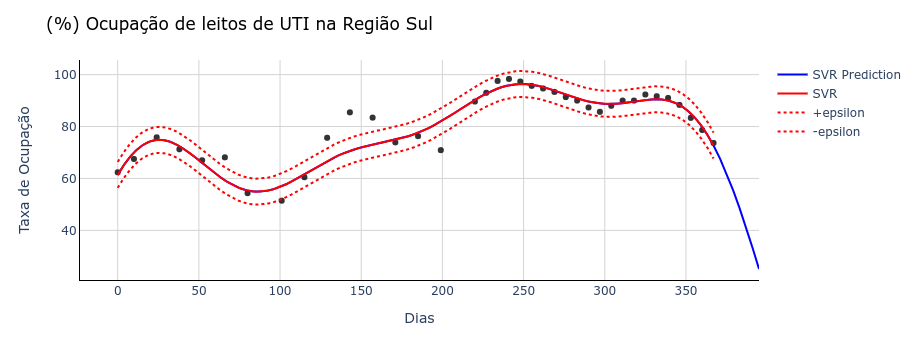

In [79]:
title = '(%) Ocupação de leitos de UTI na Região Sul'
predicted_value = predict_uti(sul, title)

In [80]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 63.38%
14 dias: 52.15%
21 dias: 39.26%
28 dias: 25.11%


In [81]:
valid_uti(sul)

MÉTRICAS:
- MAE: 3.0474
- RMSE: 4.0556
- MAPE: 0.0461


![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# **REGIÃO SUDESTE**

/home/vini-silva/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



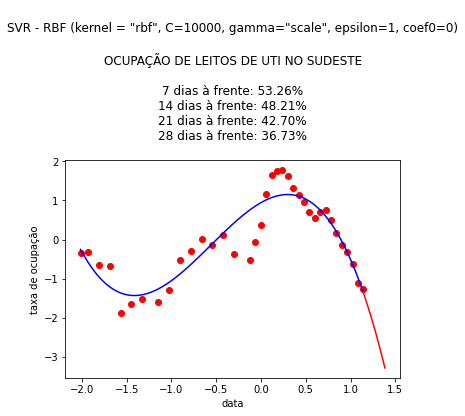

In [82]:
title = 'OCUPAÇÃO DE LEITOS DE UTI NO SUDESTE'
predict(sudeste, title)

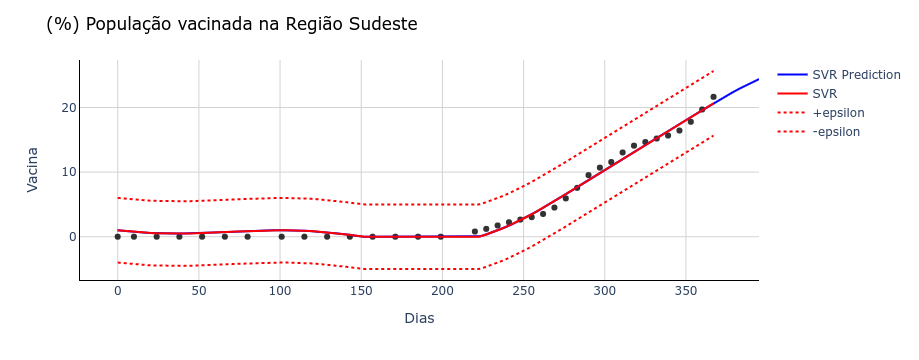

In [83]:
title = '(%) População vacinada na Região Sudeste'
predicted_value = predict_vac(sudeste, title)

In [84]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 21.68%
14 dias: 22.66%
21 dias: 23.58%
28 dias: 24.40%


In [85]:
valid_vac(sudeste)

MÉTRICAS:
- MAE: 0.7834
- RMSE: 0.9804
- MAPE: 2647378457947898.5000


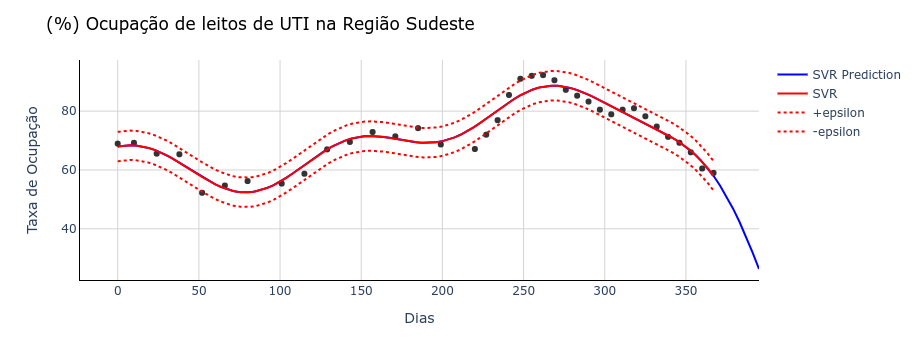

In [86]:
title = '(%) Ocupação de leitos de UTI na Região Sudeste'
predicted_value = predict_uti(sudeste, title)

In [87]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 51.98%
14 dias: 44.66%
21 dias: 36.07%
28 dias: 26.33%


In [88]:
valid_uti(sudeste)

MÉTRICAS:
- MAE: 4.9981
- RMSE: 6.8847
- MAPE: 0.0720


![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# **REGIÃO CENTRO-OESTE**

/home/vini-silva/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



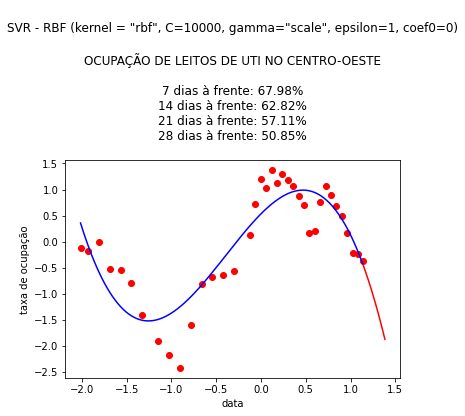

In [89]:
title = 'OCUPAÇÃO DE LEITOS DE UTI NO CENTRO-OESTE'
predict(centro_oeste, title)

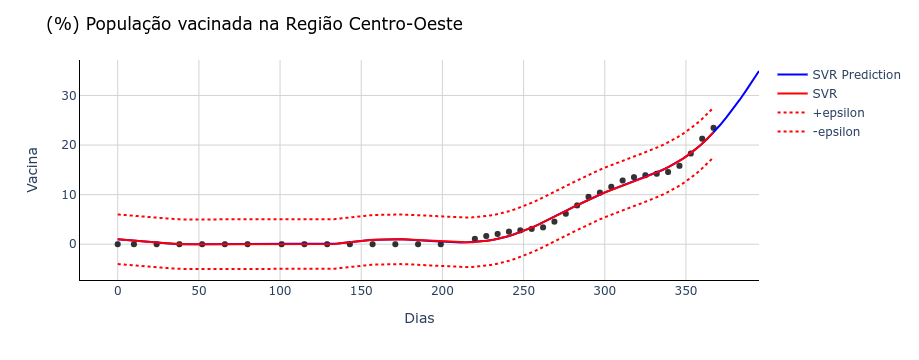

In [90]:
title = '(%) População vacinada na Região Centro-Oeste'
predicted_value = predict_vac(centro_oeste, title)

In [91]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 25.19%
14 dias: 28.17%
21 dias: 31.44%
28 dias: 34.93%


In [92]:
valid_vac(centro_oeste)

MÉTRICAS:
- MAE: 0.9801
- RMSE: 1.1901
- MAPE: 2837168565334645.0000


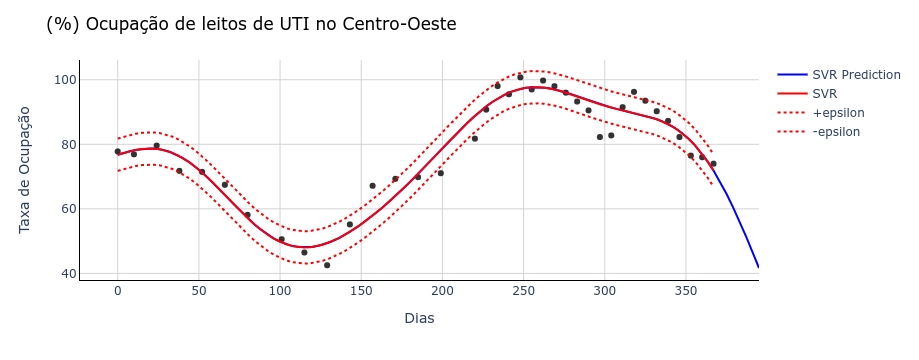

In [93]:
title = '(%) Ocupação de leitos de UTI no Centro-Oeste'
predicted_value = predict_uti(centro_oeste, title)

In [94]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 65.60%
14 dias: 58.35%
21 dias: 50.28%
28 dias: 41.67%


In [95]:
valid_uti(centro_oeste)

MÉTRICAS:
- MAE: 2.5750
- RMSE: 3.4559
- MAPE: 0.0361


![purple-divider](https://user-images.githubusercontent.com/7065401/52071927-c1cd7100-2562-11e9-908a-dde91ba14e59.png)

# **APLICAÇÃO DO SVR - 2 Variáveis Indepentes**
- Armazenar o resultado da predição da vacinação
- Usar o resultado da predição da vacinação para predizer a ocupação de leitos de UTI
- Plotar o plano que representa a predição da ocupação de leitos de UTI
---

In [96]:
# Importando módulo da biblioteca criada

from SVR.model2 import predict_UTI, plot_UTI_3D, predict_UTI_3D, valid_UTI

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# BRASIL

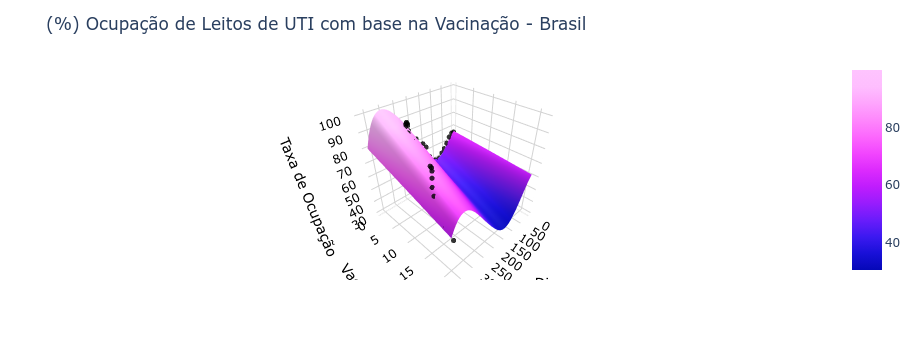

In [97]:
title = 'Brasil'
plot_UTI_3D(brasil, title)

In [98]:
valid_UTI(brasil)

MÉTRICAS:
- MAE: 3.4081
- RMSE: 4.3825
- MAPE: 0.0490


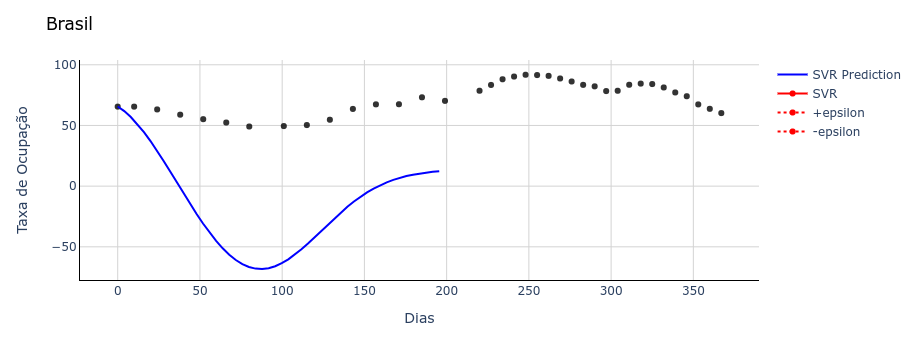

array([60.13290164, 54.91226236, 49.13920561, 42.85647649, 36.11953609])

In [99]:
title = 'Brasil'
predict_UTI(brasil, title)

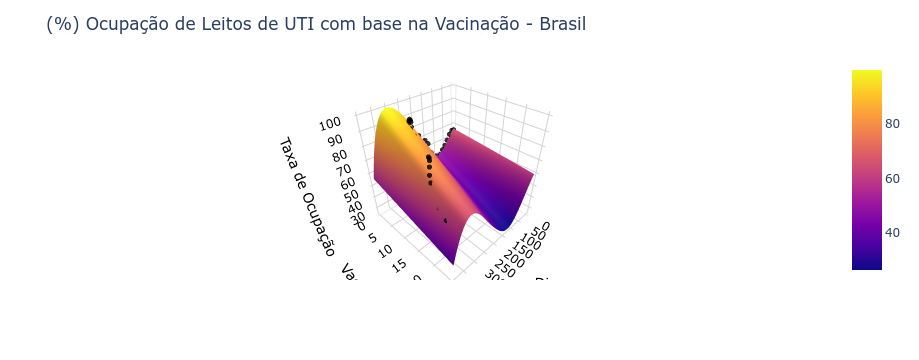

In [100]:
title = 'Brasil'
predicted_value = predict_UTI_3D(brasil, title)

In [101]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'- {i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
- 7 dias: 54.91%
- 14 dias: 49.14%
- 21 dias: 42.86%
- 28 dias: 36.12%


![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# REGIÃO NORTE

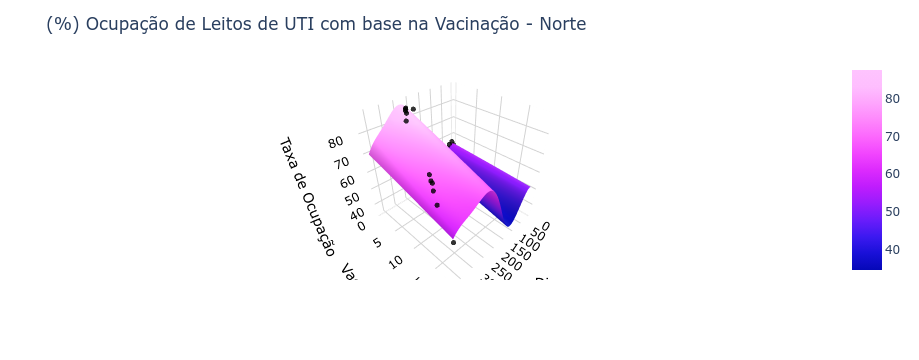

In [103]:
title = 'Norte'
plot_UTI_3D(norte, title)

In [104]:
valid_UTI(norte)

MÉTRICAS:
- MAE: 4.2266
- RMSE: 5.3936
- MAPE: 0.0679


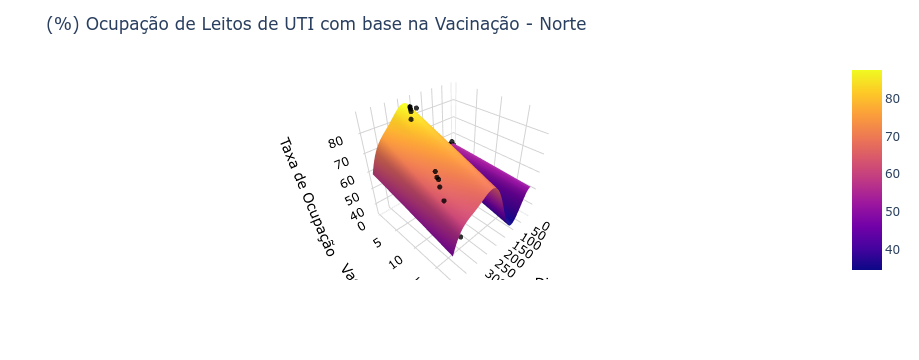

In [105]:
title = 'Norte'
predicted_value = predict_UTI_3D(norte, title)

In [106]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 55.84%
14 dias: 53.38%
21 dias: 50.55%
28 dias: 47.32%


![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# NORDESTE

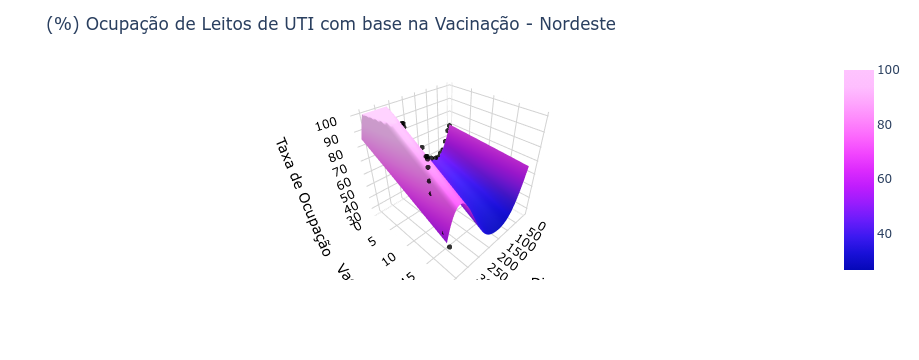

In [107]:
title = 'Nordeste'
plot_UTI_3D(nordeste, title)

In [108]:
valid_UTI(nordeste)

MÉTRICAS:
- MAE: 2.7322
- RMSE: 3.2081
- MAPE: 0.0403


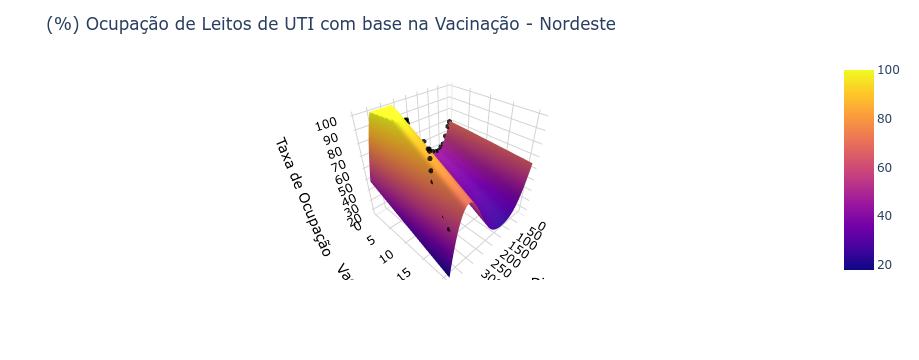

In [109]:
title = 'Nordeste'
predicted_value = predict_UTI_3D(nordeste, title)

In [110]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 45.39%
14 dias: 36.14%
21 dias: 26.09%
28 dias: 15.36%


![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# REGIÃO SUDESTE

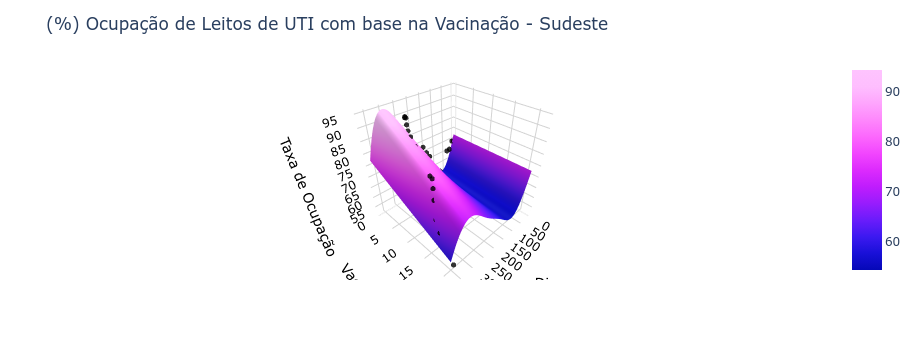

In [111]:
title = 'Sudeste'
plot_UTI_3D(sudeste, title)

In [112]:
valid_UTI(sudeste)

MÉTRICAS:
- MAE: 4.7375
- RMSE: 6.1222
- MAPE: 0.0686


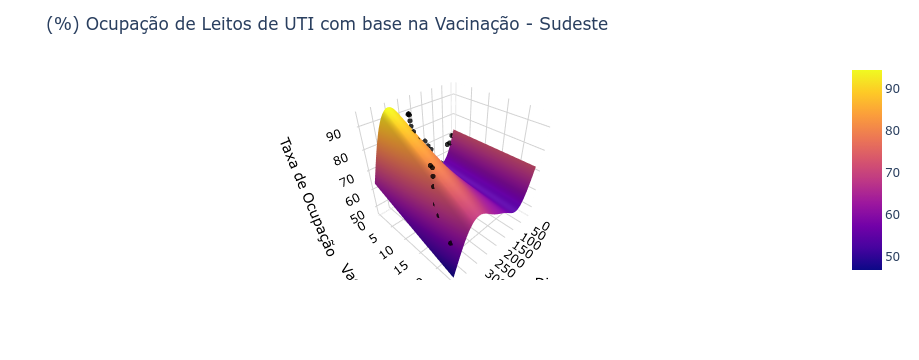

In [113]:
title = 'Sudeste'
predicted_value = predict_UTI_3D(sudeste, title)

In [114]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 55.53%
14 dias: 52.28%
21 dias: 49.17%
28 dias: 46.27%


![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# REGIÃO SUL

In [115]:
title = 'Sul'
plot_UTI_3D(sul, title)

In [116]:
valid_UTI(sul)

MÉTRICAS:
- MAE: 7.9167
- RMSE: 11.0068
- MAPE: 0.1200


In [117]:
title = 'Sul'
predicted_value = predict_UTI_3D(sul, title)

In [118]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 69.47%
14 dias: 62.00%
21 dias: 53.17%
28 dias: 43.11%


![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

# REGIÃO CENTRO-OESTE

In [119]:
title = 'Centro-Oeste'
plot_UTI_3D(centro_oeste, title)

In [120]:
valid_UTI(centro_oeste)

MÉTRICAS:
- MAE: 3.7979
- RMSE: 4.4497
- MAPE: 0.0520


In [121]:
title = 'Centro-Oeste'
predicted_value = predict_UTI_3D(centro_oeste, title)

In [122]:
print(f'RESULTADO:')
for i in range(1, 5):
    print(f'{i*7} dias: {predicted_value[i]:.2f}%')

RESULTADO:
7 dias: 69.86%
14 dias: 65.55%
21 dias: 60.93%
28 dias: 56.05%


Último dia: 297, data 2021-05-11


/home/vini-silva/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



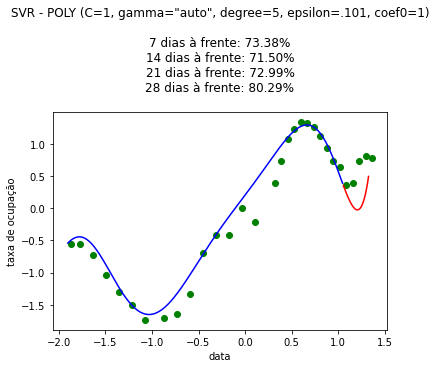

In [123]:
# Importando as bibliotecas
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Lendo o dataset de exemplo
dataset = pd.read_csv('dados/ocup_leitos_brasil_ant.csv')
X = dataset.iloc[:, 0].values.reshape(-1, 1)
y = dataset.iloc[:, 1].values.reshape(-1, 1)
z = dataset.iloc[:, 2].values.reshape(-1, 1)

a =  brasil.iloc[:31, 1].values.reshape(-1, 1)
b =  brasil.iloc[:31, 2].values.reshape(-1, 1)

# Último dia da lista
last_day = X[len(X)-1][0]
last_date = z[len(z)-1][0]
print(f'Último dia: \033[1;32m{last_day}\033[;m, data \033[1;32m{last_date}\033[;m')

# Determiando dias para predizer valores futuros
x1 = np.array([[last_day], [last_day+7], [last_day+14], [last_day+21], [last_day+28]])

# Inserindo os dias para predizer dados futuros no array
X = np.concatenate((X, x1), axis=0)

# Normalizando os dados
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()
sc_a = StandardScaler()
sc_b = StandardScaler()
X = sc_X.fit_transform(X)
y = sc_y.fit_transform(y)

a = sc_a.fit_transform(a)
b = sc_b.fit_transform(b)


X_pred = X[27:]

# Desacoplando valores futuros de X (dias)
X = np.delete(X, len(X)-1, 0)
X = np.delete(X, len(X)-1, 0)
X = np.delete(X, len(X)-1, 0)
X = np.delete(X, len(X)-1, 0)
X = np.delete(X, len(X)-1, 0)

# # # #fitting os dados usando o kernel RBF
from sklearn.svm import SVR
regressor = SVR(kernel = 'poly', C=1, gamma='auto', degree=8, epsilon=.101, coef0=1)
regressor.fit(X, y)

# Predizendo para valores de X futuros
y_pred = regressor.predict(X_pred)
y_pred = sc_y.inverse_transform(y_pred)

X_grid = np.arange(min(X), max(X), 0.01) #curva suave
X_grid = X_grid.reshape((len(X_grid), 1))

X_pred = np.arange(min(X_pred), max(X_pred), 0.01) #curva suave
X_pred = X_pred.reshape((len(X_pred), 1))

# Visualizando os dados 
plt.scatter(a, b, color = 'green')
plt.plot(X_grid, regressor.predict(X_grid), color = 'blue')
plt.plot(X_pred, regressor.predict(X_pred), color = 'red')
plt.title('SVR - POLY (C=1, gamma="auto", degree=5, epsilon=.101, coef0=1)\n\n'
          f'7 dias à frente: {y_pred[1]:.2f}%\n'
          f'14 dias à frente: {y_pred[2]:.2f}%\n'
          f'21 dias à frente: {y_pred[3]:.2f}%\n'
          f'28 dias à frente: {y_pred[4]:.2f}%\n')
plt.xlabel('data')
plt.ylabel('taxa de ocupação')
plt.show()

---
---
---
---
---
---
# TESTE PARA NOVOS HIPERPARÂMETROS
---
---
---
---
---
---

---
# PARTE 2

In [167]:
# Setando parâmetros para o modelo
regressor = SVR(kernel = 'rbf', C=10_000, gamma='scale', epsilon=1, coef0=0)
        
# Selecionado variáveis
X = brasil['Dias'].values.reshape(-1, 1)
y = brasil['Vacina'].values #.reshape(-1, 1)   
z = brasil.iloc[:, 0].values.reshape(-1, 1)

    # Último dia da lista
last_day = X[len(X)-1][0]
last_date = z[len(z)-1][0]
        
    # Determiando dias para predizer valores futuros
x1 = np.array([[last_day], [last_day+7], [last_day+14], [last_day+21], [last_day+28]])
     
    # Treinando o modelo
regressor.fit(X, y)

    # Predizendo para valores de X futuros
    # ------- VALOR QUE SERÁ RETORNADO NA FUNÇÃO -------
y_pred = regressor.predict(x1)

In [168]:
 # -------  GERANDO VALOR DA PREDIÇÃO DA OCUPAÇÃO DE LEITOS --------
X = brasil[['Dias', 'Vacina']]     
y = brasil['Taxa de Ocupação'].values       
z = brasil.iloc[:, 0].values.reshape(-1, 1)
    
# Último dia da lista
last_day = X['Dias'][-1]#[0]
last_date = z[len(z)-1]#[0]
        
# Determiando dias para predizer valores futuros
x1 = np.array([last_day, last_day+7, last_day+14, last_day+21, last_day+28])
# Valores futuros de vacinação
x2 = np.array([y_pred[0], y_pred[1], y_pred[2], y_pred[3], y_pred[4]])

X_plot = pd.DataFrame({'Dias': X['Dias'], 'Vacina': X['Vacina']})
X_pred = pd.DataFrame({'Dias': x1, 'Vacina': x2})
    
cont = 1
for i in range(len(X_plot), len(X_plot)+4):
    X_plot.loc[i, 'Dias']  = X_pred['Dias'][cont]
    X_plot.loc[i, 'Vacina'] = X_pred['Vacina'][cont]
    cont += 1 

# Treinando o modelo
regressor.fit(X, y)

SVR(C=10000, coef0=0, epsilon=1)

In [169]:
YX_pred = regressor.predict(X)
YX_pred

array([66.51106389, 64.74783234, 61.49898013, 57.87273991, 54.44915202,
       51.73808457, 50.12672182, 50.2307468 , 52.01607885, 55.0113609 ,
       58.95940675, 63.55167055, 68.4773325 , 73.46377549, 78.30177477,
       83.65275333, 84.92188304, 86.00478533, 86.97061763, 88.1029118 ,
       89.13072671, 89.85136845, 89.41267682, 87.89911148, 86.14343107,
       84.19137695, 83.35867162, 82.74256833, 81.6034458 , 80.53794466,
       79.40983261, 78.02766026, 76.18537092, 73.41830462, 69.66887378,
       64.70424924, 59.18575648])

In [170]:
# Predizendo para valores de X futuros
# ----- VALOR QUE A FUNÇÃO IRÁ RETORNAR -----
Y_pred = regressor.predict(X_pred)
Y_pred

array([60.13290164, 54.91226236, 49.13920561, 42.85647649, 36.11953609])

In [173]:
# Create 100 evenly spaced points from smallest X to largest X
x_range = np.linspace(X['Dias'].min(), X['Dias'].max(), 100)
# Predict y values for our set of X values
y_svr = regressor.predict(X)

# Create 100 evenly spaced points from smallest X to largest X
xx_range = np.linspace(X_pred['Dias'].min(), X_pred['Dias'].max(), 100)
# Predict y values for our set of X values
yyy_svr = regressor.predict(X_pred)

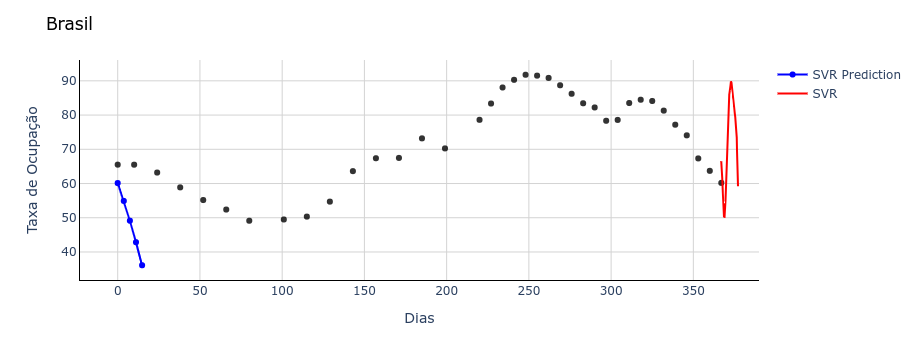

In [174]:
# Create a scatter plot
fig = px.scatter(brasil, x=brasil['Dias'], y=brasil['Taxa de Ocupação'], 
                     opacity=0.8, color_discrete_sequence=['black'])

# Add a best-fit line
fig.add_traces(go.Scatter(x=X['Dias'], y=yyy_svr, name='SVR Prediction', line=dict(color='blue')))
fig.add_traces(go.Scatter(x=X_pred, y=y_svr, name='SVR', line=dict(color='red')))
#fig.add_traces(go.Scatter(x=x_range, y=y_svr+5, name='+epsilon', line=dict(color='red', dash='dot')))
#fig.add_traces(go.Scatter(x=x_range, y=y_svr-5, name='-epsilon', line=dict(color='red', dash='dot')))
#fig.add_traces(go.Scatter(x=0, y=0, name=f'{y_pred[1]}', line=dict(color='white')))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title=dict(text=f"   Brasil", 
                            font=dict(color='black')))

# Update marker size
fig.update_traces(marker=dict(size=6))

fig.show()